# Imports

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
from scipy import stats as st

import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
#!pip install pandas-profiling
import pandas_profiling # a feature for lazy

PydanticImportError: `BaseSettings` has been moved to the `pydantic-settings` package. See https://docs.pydantic.dev/2.8/migration/#basesettings-has-moved-to-pydantic-settings for more details.

For further information visit https://errors.pydantic.dev/2.8/u/import-error

# Data

In [ ]:
# read data and show a few rows
df = pd.read_csv('../jupyter-workspace/data/AH_patients.csv', index_col=0, encoding='cp1251')
pd.set_option("display.max_columns", None) # display all columns
df.head()

,ФИО,Адрес,Возраст,Пол,Рост,Вес,Фракция выброса Симпсона,Конечный диастолический объем,Конечный сиастолический объем,Ударный объем,Сахарный диабет,Ишемическая болезнь сердца,Хроническая обструктивная болезнь легких,Ожирение,Артериальная Гипертензия,Аортальный порок,Нарушения ритма,Аневризма аорты,Гипотензивная терапия,Липидснижающие препараты,Аортальный стеноз,Аортальная регургитация,Курение,Максимальное САД,Максимальное ДАД,Холестерин общий,Триглицериды,ЛПВП,ЛПНП
0,Демид Смеянов,Аллея Докучаев 563,53,0,168.575254,82.397944,67.429361,112.570639,34.429361,78.141277,0,1,0,0,1,0,0,0,0,0,0,0,0,160.000000,90.000000,5.090637,1.672534,1.167593,0.761079
1,Ерен Гомаюнов,Аллея Почтовая Б. 1061,67,1,172.991342,86.428550,49.468563,111.468563,56.468563,55.468563,0,1,1,0,1,0,1,0,0,0,0,0,0,110.000000,80.000000,5.802555,1.672534,1.167593,0.761079
2,Габриэлла Коташова,ул. Усиевича 2-я 1290,63,0,158.743237,65.513525,59.486475,110.513525,44.770288,65.743237,0,1,0,0,1,0,0,0,0,0,0,0,0,138.549637,82.973915,5.090637,1.672534,1.167593,0.761079
3,Ясен Берердинов,Аллея Ипатовка Новая 9,62,0,164.094481,89.986503,61.013497,132.013497,45.013497,87.000000,0,1,0,1,1,0,0,0,0,0,0,0,0,138.549637,82.973915,5.112899,1.666966,1.171134,0.758635
4,Маржанат Милидеева,Аллея Косинская Б. 1364,76,1,168.575254,82.397944,55.900440,87.900440,39.000000,68.985297,0,1,1,0,1,0,0,0,0,0,0,0,0,139.502198,85.000000,6.094011,2.109912,1.358988,0.761079


Data contains names and addresses of patients, but they are anonymized by fake entities. There is no sense in these columns anyway, since each row represents a patient.

In [ ]:
df.drop(['ФИО', 'Адрес'], axis=1, inplace=True) # unimportant variables

We can have a brief look at columns via `info` method. We saw first rows and all columns before (by setting `pandas` display options), but here we can investigate their types and non-null record count.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44000 entries, 0 to 43999
Data columns (total 27 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Возраст                                   44000 non-null  int64  
 1   Пол                                       44000 non-null  int64  
 2   Рост                                      44000 non-null  float64
 3   Вес                                       44000 non-null  float64
 4   Фракция выброса Симпсона                  44000 non-null  float64
 5   Конечный диастолический объем             44000 non-null  float64
 6   Конечный сиастолический объем             44000 non-null  float64
 7   Ударный объем                             44000 non-null  float64
 8   Сахарный диабет                           44000 non-null  int64  
 9   Ишемическая болезнь сердца                44000 non-null  int64  
 10  Хроническая обструктивная болезнь 

What are good data-no missing values! Of course, since it is not a real case. The records are synthetic, but fair to say they were derived from real patients.

Let us set the cardiac rhythm disorder as a target variable.

In [ ]:
TARGET = 'Нарушения ритма' # Rhythm disturbances
TARGET_1 = 'Максимальное САД' # for practice

# Exploratory Data Analysis (EDA)

Primarily EDA is for seeing what the data can tell us beyond the formal modeling or hypothesis testing task. It is a good practice to understand the data and try to gather as many insights from it first.

<img src="../jupyter-workspace/data-analysis-for-ML.png"/>

## Univariate Analysis

Well, we read the data, looked at how many columns there are, and roughly understood what the features are. So, what's the next move?

It is necessary to look at each of these variables (features, columns) separately, for a start. At least to understand:
- how many numeric/categorical features are in the data;
- are there any binary or ordinal features among the categorical ones;
- how the features are distributed;
- are there obvious outliers;
- how do individual features relate to the target variable;
- etc.

Some descriptive statistics can be easily viewed by `describe` method.

In [ ]:
df.describe()

,Возраст,Пол,Рост,Вес,Фракция выброса Симпсона,Конечный диастолический объем,Конечный сиастолический объем,Ударный объем,Сахарный диабет,Ишемическая болезнь сердца,Хроническая обструктивная болезнь легких,Ожирение,Артериальная Гипертензия,Аортальный порок,Нарушения ритма,Аневризма аорты,Гипотензивная терапия,Липидснижающие препараты,Аортальный стеноз,Аортальная регургитация,Курение,Максимальное САД,Максимальное ДАД,Холестерин общий,Триглицериды,ЛПВП,ЛПНП
count,44000.000000,44000.000000,44000.000000,44000.000000,44000.000000,44000.000000,44000.000000,44000.000000,44000.000000,44000.000000,44000.000000,44000.000000,44000.0,44000.000000,44000.000000,44000.000000,44000.0,44000.000000,44000.000000,44000.000000,44000.000000,44000.000000,44000.000000,44000.000000,44000.000000,44000.000000,44000.000000
mean,61.269795,0.519568,168.579565,82.369910,57.577935,119.067842,49.722162,69.018285,0.102932,0.786273,0.070205,0.209750,1.0,0.001841,0.273591,0.083432,0.0,0.095295,0.039545,0.070068,0.031636,138.466660,82.885537,5.082512,1.654649,1.168228,0.755948
std,12.895246,0.499623,6.064915,11.047149,9.802847,38.884834,30.856049,29.318209,0.303873,0.409941,0.255494,0.407135,0.0,0.042867,0.445807,0.276537,0.0,0.293626,0.194891,0.255265,0.175032,13.079389,6.209783,0.673112,0.463173,0.156922,0.176442
min,16.000000,0.000000,40.649929,40.041596,5.000000,10.098237,3.024712,16.199894,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,56.342080,6.932787,1.874280,0.329481,0.290518,0.148936
25%,54.000000,0.000000,168.575254,82.091839,55.357296,94.000000,31.385802,59.176444,0.000000,1.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,137.603628,80.000000,4.951846,1.582637,1.167593,0.761079
50%,62.000000,1.000000,168.575254,82.397944,59.226350,110.881170,41.449398,68.985297,0.000000,1.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,138.549637,82.973915,5.090637,1.672534,1.167593,0.761079
75%,70.000000,1.000000,168.575254,82.397944,64.064319,133.867097,53.335776,76.591955,0.000000,1.000000,0.000000,0.000000,1.0,0.000000,1.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,138.750580,82.973915,5.150944,1.672534,1.167593,0.761079
max,100.000000,1.000000,260.224078,168.421217,90.007627,300.000000,395.446535,5183.365193,1.000000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,270.000000,140.000000,13.986348,19.343175,3.449438,8.874948


In [ ]:
pd.reset_option("max_columns")

We can notice that there is an anomaly in 'Ударный объем' (Stroke volume) column. Some statistics are strange, because several variables are binary. So, let us see the detailed description of data with `PandasProfiling`.

In [ ]:
profile_report = pandas_profiling.ProfileReport(df, progress_bar=False)
profile_report.to_notebook_iframe()

It suggests some actions with respect to observations in data: high correlations, missing values, uninformative variables, etc. There are variables we should reject since they are constants. This situation is predictable, because we use data on patients with arterial hypertension (little wonder they all have antihypertensive therapy). So, let us take this advice to remove these features.

In [ ]:
rej_vars = profile_report.get_rejected_variables()
rej_vars

{'Артериальная Гипертензия', 'Гипотензивная терапия'}

In [ ]:
df.drop(rej_vars, axis=1, inplace=True)

We also can derive different metadata from the report. Let us use this information to distinguish numerical and categorical variables for further analysis.

In [ ]:
var_info = profile_report.get_description()['variables'] # metadata from report
var_info

{'Возраст': {'n_distinct': 83,
  'p_distinct': 0.0018863636363636363,
  'is_unique': False,
  'n_unique': 2,
  'p_unique': 4.545454545454545e-05,
  'type': 'Numeric',
  'hashable': True,
  'value_counts_without_nan': 64     1606
  61     1588
  65     1524
  67     1513
  63     1505
         ... 
  97        3
  96        3
  94        3
  98        1
  100       1
  Name: Возраст, Length: 83, dtype: int64,
  'value_counts_index_sorted': 16     50
  17     55
  18     77
  19     48
  20     54
         ..
  94      3
  96      3
  97      3
  98      1
  100     1
  Name: Возраст, Length: 83, dtype: int64,
  'ordering': True,
  'n_missing': 0,
  'n': 44000,
  'p_missing': 0.0,
  'count': 44000,
  'memory_size': 704000,
  'n_zeros': 0,
  'n_negative': 0,
  'p_negative': 0.0,
  'n_infinite': 0,
  'mean': 61.26979545454545,
  'std': 12.895246257241046,
  'variance': 166.28737603488923,
  'min': 16,
  'max': 100,
  'kurtosis': 0.6831001586895593,
  'skewness': -0.6754718299437753,
  'sum

In [ ]:
NUMERICAL = []
CATEGORICAL = []
for var in var_info:
    if var in rej_vars: continue
    if var_info[var]['type'] == 'Numeric':
        NUMERICAL += [var]
    elif var_info[var]['type'] == 'Categorical':
        CATEGORICAL += [var]

if TARGET in NUMERICAL:
    NUMERICAL.remove(TARGET)
elif TARGET in CATEGORICAL:
    CATEGORICAL.remove(TARGET)

print('Num. of numeric variables: {}'.format(len(NUMERICAL)))
print('Num. of categorical variables: {}'.format(len(CATEGORICAL)))

Num. of numeric variables: 13
Num. of categorical variables: 11


Let's start with an inspection of the target.

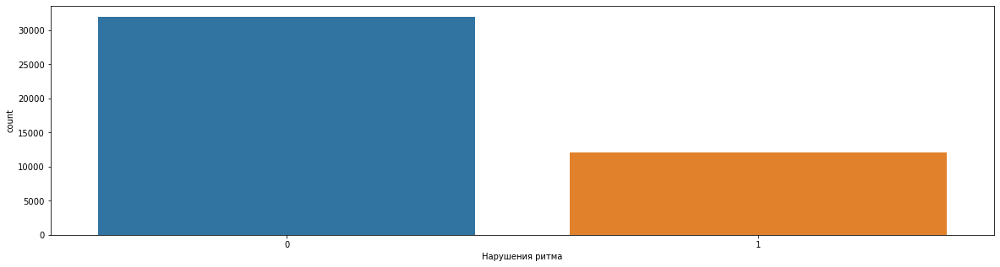

In [ ]:
plt.figure(figsize=(20, 5))
sns.countplot(x=TARGET, data=df)
plt.show()

Classes are highly imbalanced. This will not perform good in classification.

### Numeric Features

Let's look at age distribution.

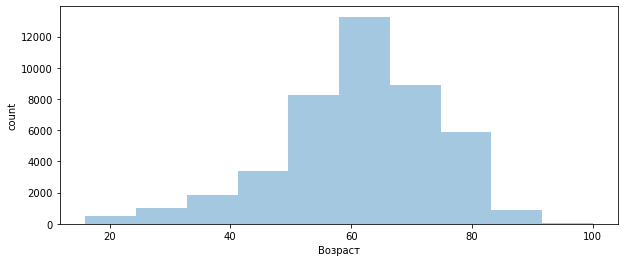

In [ ]:
plt.figure(figsize=(10, 4))
sns.distplot(df['Возраст'], bins=10, kde=False)
plt.ylabel('count')
plt.show();

Not a rosy picture... Since there is the right-skewness and no normality, we can not use, e.g., a t- or z-test. Well, let's visualize different groups.

In [ ]:
def plot_histograms_by_target(data, feature_name, target_name):
    fig, axes = plt.subplots(data[target_name].nunique(), 1, sharey=True, figsize=(10, 6))
    color = plt.cm.coolwarm(np.linspace(0,1,data[target_name].nunique()))
    for i, tar in enumerate(data[target_name].unique()):
        axes[i].hist(data[data[target_name] == tar][feature_name],
            bins=20,
            label=str(tar),
            density=True,
            stacked=True,
            color=color[i]
        )
        axes[i].set_xlabel('{} ({} = {})'.format(feature_name, target_name, tar))
        axes[i].set_ylabel('Density')
    plt.tight_layout()
    plt.show();

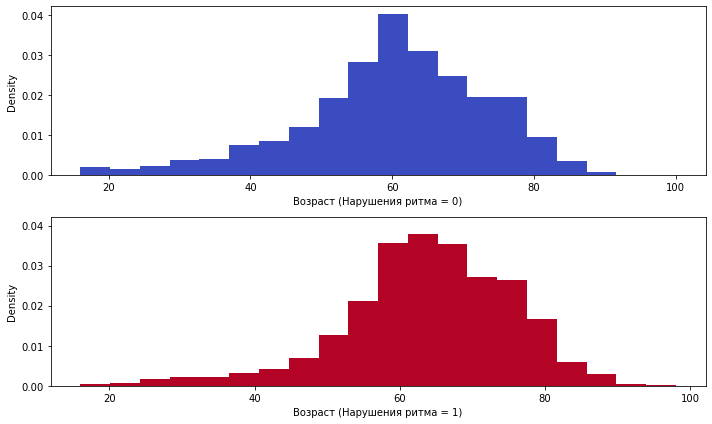

In [ ]:
plot_histograms_by_target(df, 'Возраст', TARGET)

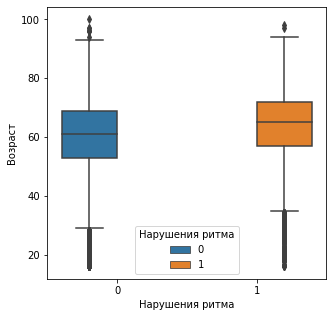

In [ ]:
plt.figure(figsize=(5, 5))
sns.boxplot(x=TARGET, y='Возраст', hue=TARGET, data=df)
plt.show();

Okay, they are different, but anyway we can try some statistical tests, e.g., compute the Kolmogorov-Smirnov statistic or Wilcoxon rank-sum statistic on 2 samples.

In [ ]:
st.ks_2samp(
    df[df[TARGET] == 0]['Возраст'],
    df[df[TARGET] == 1]['Возраст']
)

KstestResult(statistic=0.1362247549343646, pvalue=5.2603717809487154e-142)

In [ ]:
st.ranksums(
    df[df[TARGET] == 0]['Возраст'],
    df[df[TARGET] == 1]['Возраст']
)

RanksumsResult(statistic=-26.892915654616047, pvalue=2.6579134457901623e-159)

P-value is very small, so we reject the hypothesis about the same distributions.

More on statistical hypothesis testing:
- [Common questions and techniques](https://towardsdatascience.com/hypothesis-testing-in-machine-learning-using-python-a0dc89e169ce)
- [Cheat Sheet](https://machinelearningmastery.com/statistical-hypothesis-tests-in-python-cheat-sheet/)

In [ ]:
df.groupby(TARGET)['Возраст'].median() # medians in groups

Нарушения ритма
0    61
1    65
Name: Возраст, dtype: int64

In [ ]:
df.groupby(TARGET)['Возраст'].mean() # means in groups

Нарушения ритма
0    60.276610
1    63.906795
Name: Возраст, dtype: float64

In [ ]:
df.groupby(TARGET)['Возраст'].std() # stds in groups

Нарушения ритма
0    13.163640
1    11.754012
Name: Возраст, dtype: float64

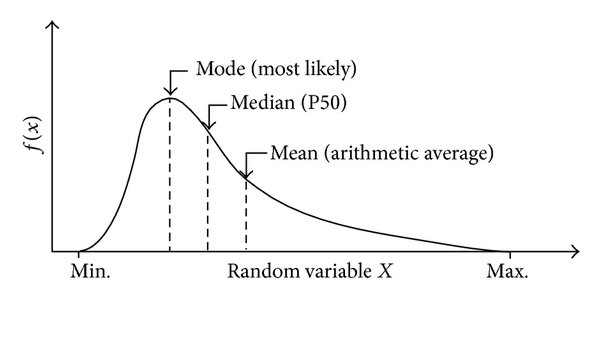

Next, let's just see graphs for other features.

Note that not all dots are outliers, they are just long tails of distributions.

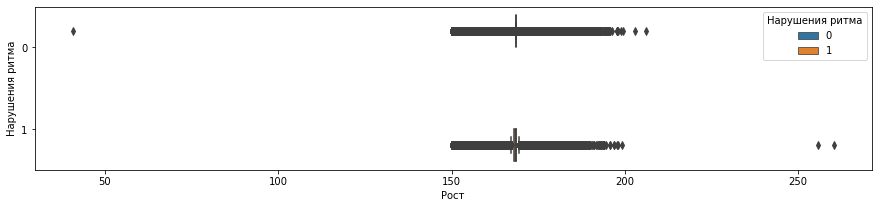

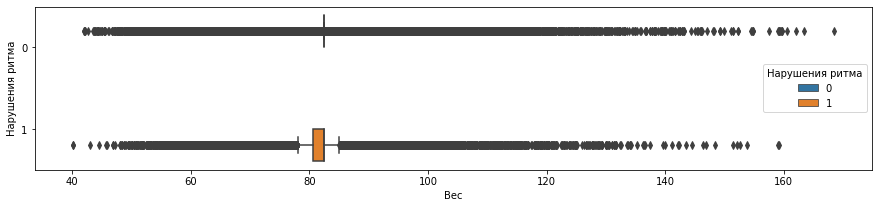

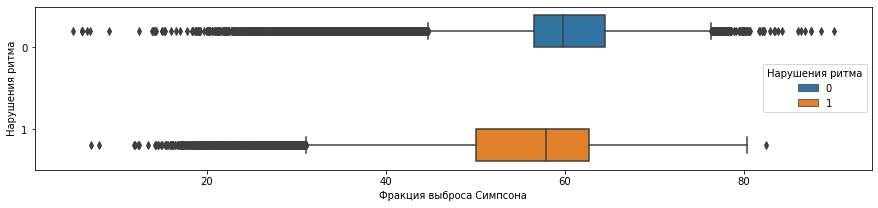

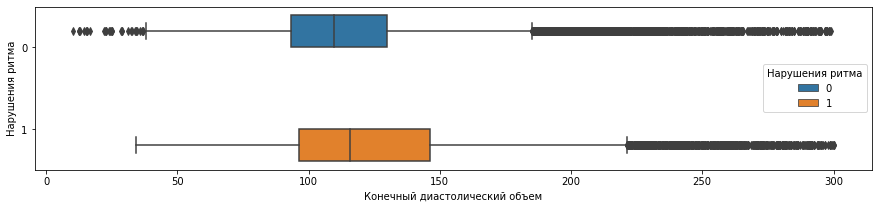

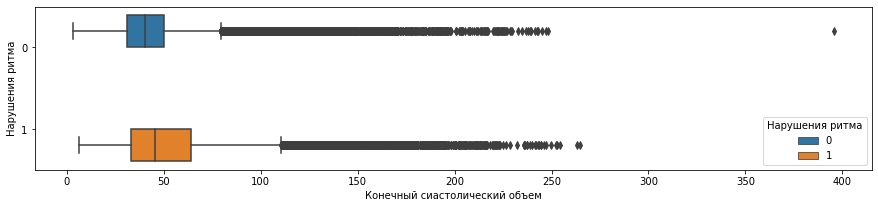

...

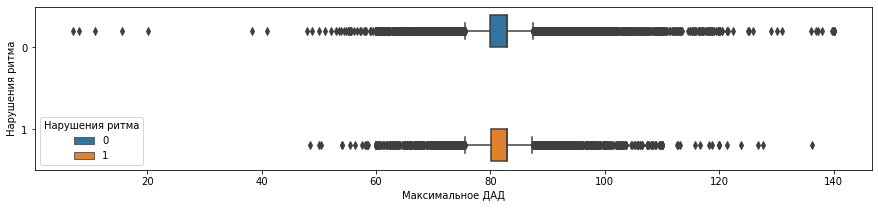

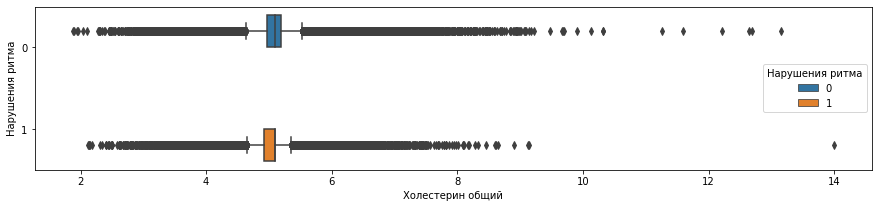

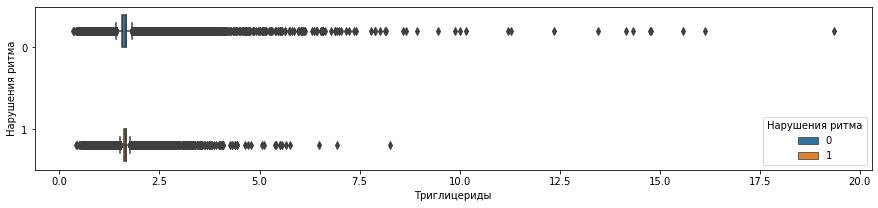

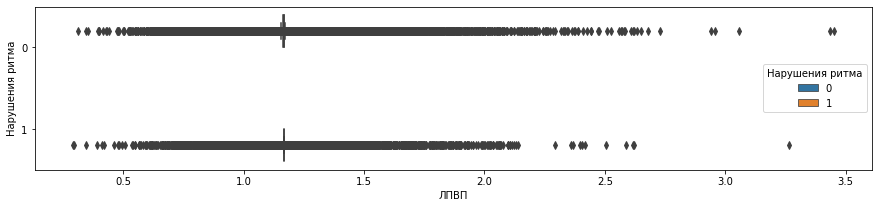

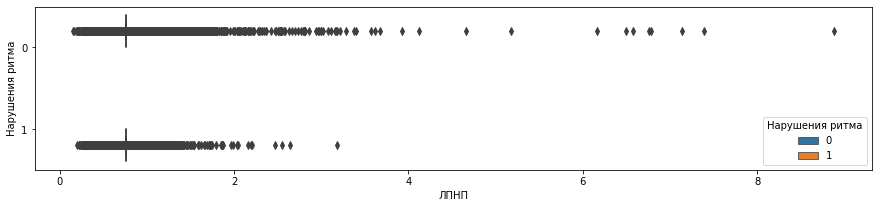

In [ ]:
for f in NUMERICAL:
    if f == 'Возраст': continue
    plt.figure(figsize=(15, 3))
    sns.boxplot(x=f, y=TARGET, hue=TARGET, data=df, orient='h')
    plt.show();

If we clean the data from outliers, there are some distributions to analyze. You can have a practice :)

### Categorical Features

In [ ]:
df[CATEGORICAL].nunique() # they all are binary variables

Пол                                         2
Сахарный диабет                             2
Ишемическая болезнь сердца                  2
Хроническая обструктивная болезнь легких    2
Ожирение                                    2
Аортальный порок                            2
Аневризма аорты                             2
Липидснижающие препараты                    2
Аортальный стеноз                           2
Аортальная регургитация                     2
Курение                                     2
dtype: int64

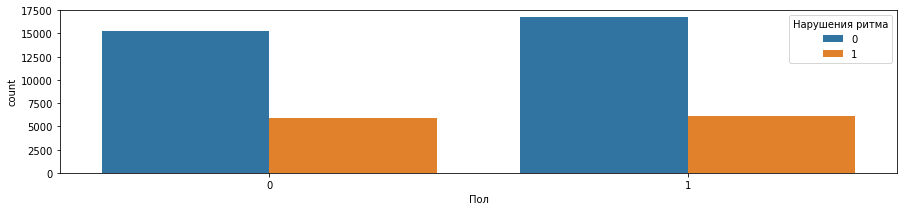

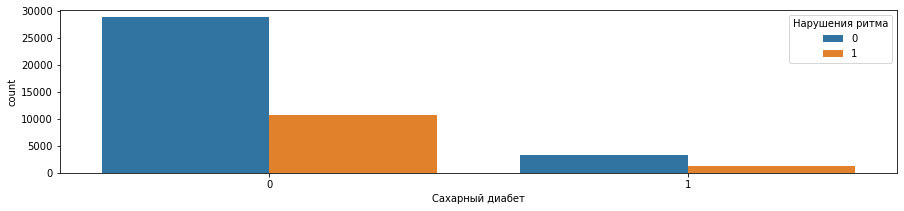

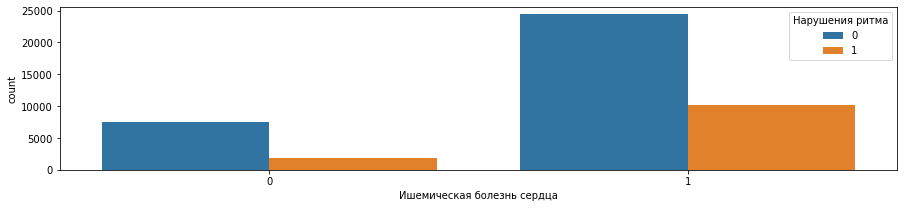

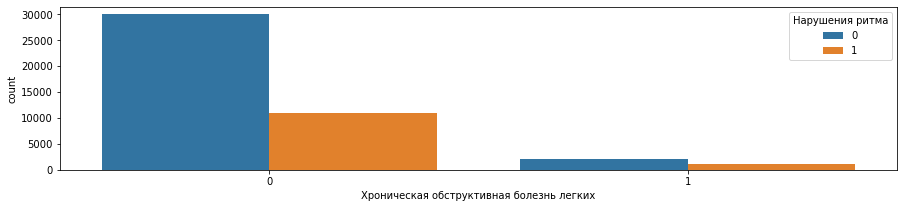

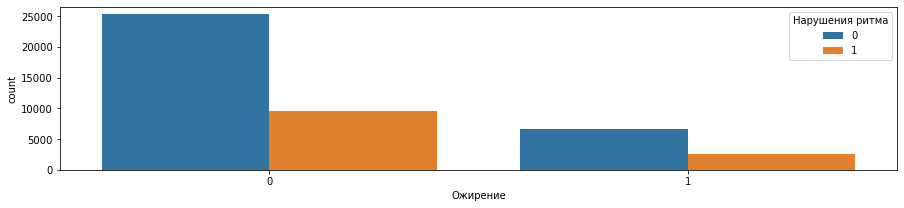

...

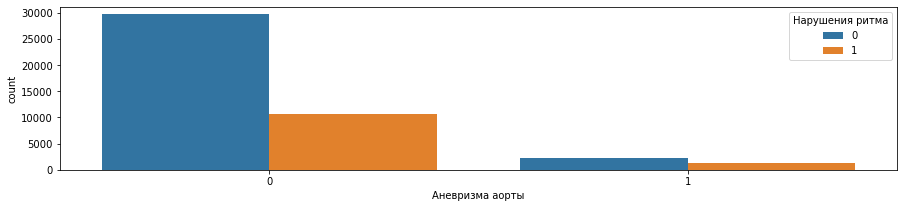

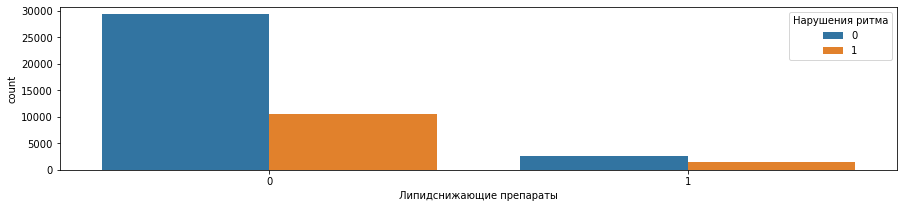

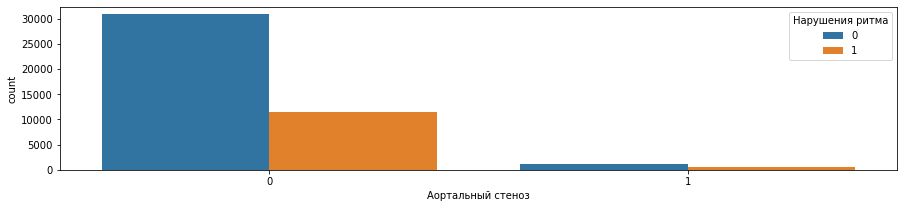

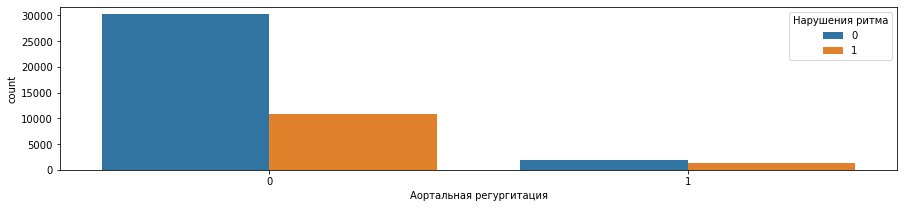

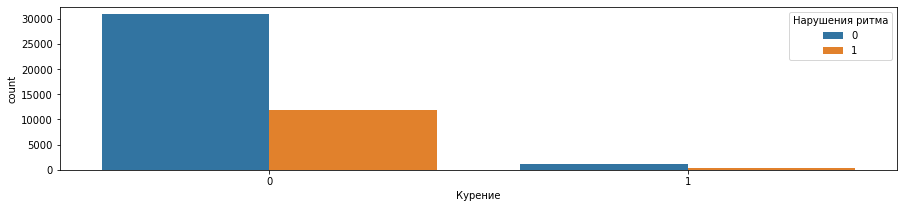

In [ ]:
for f in CATEGORICAL:
    plt.figure(figsize=(15, 3))
    sns.countplot(x=f, hue=TARGET, data=df)
    plt.show();

It seems like only gender has the similar distributions in different groups.

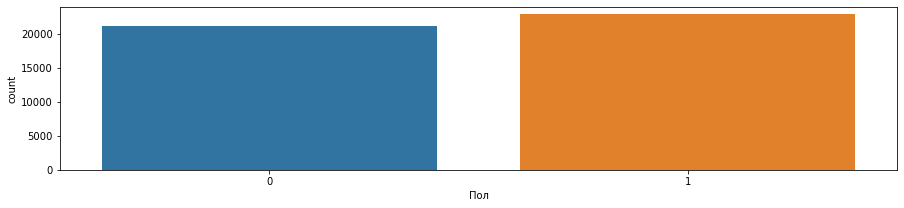

In [ ]:
plt.figure(figsize=(15, 3))
sns.countplot(x='Пол', data=df)
plt.show();

## Multivariate Analysis

Okay, it's time for more graphs!

#### Pairplots

To see visually some relationships between variables and capability of distinguishing different classes.

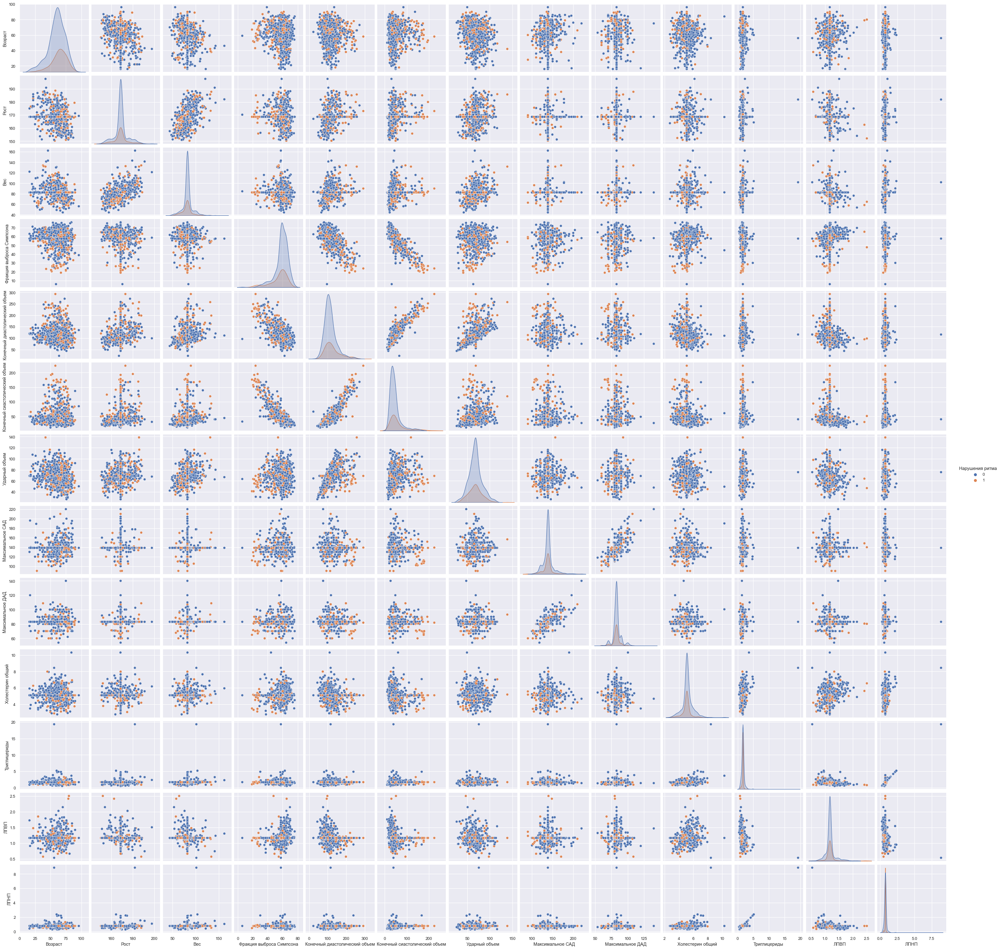

In [ ]:
sns.set(font_scale=0.9)
sns.pairplot(data=df[NUMERICAL + [TARGET]].sample(1000), hue=TARGET)
plt.show();

Note that we analysed only 1000 records due to computational issues. However, one can see something like linearity in 'Конечный систолический объем' and 'Конечный диастолический объем'.

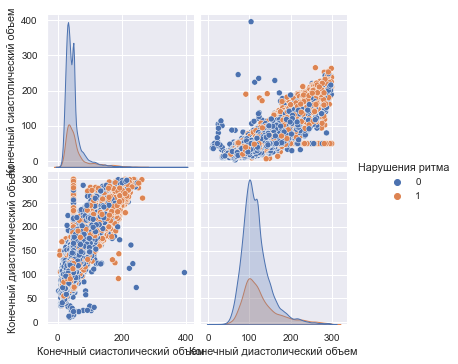

In [ ]:
sns.pairplot(data=df[['Конечный сиастолический объем', # missprint in the column name
                      'Конечный диастолический объем']+[TARGET]],
             hue=TARGET)
plt.show();

#### Correlations

Some [short explanations](https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/correlation-pearson-kendall-spearman/).

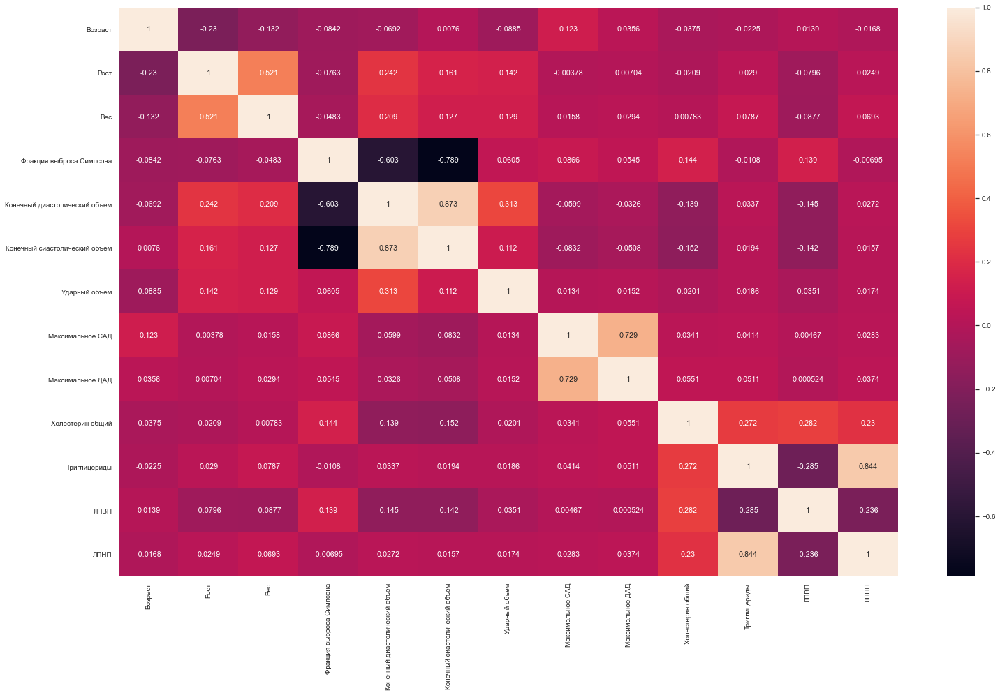

In [ ]:
pearson = df[NUMERICAL].corr()

plt.figure(figsize=(25, 15))
sns.heatmap(pearson, annot=True, fmt='.3g')
plt.show()

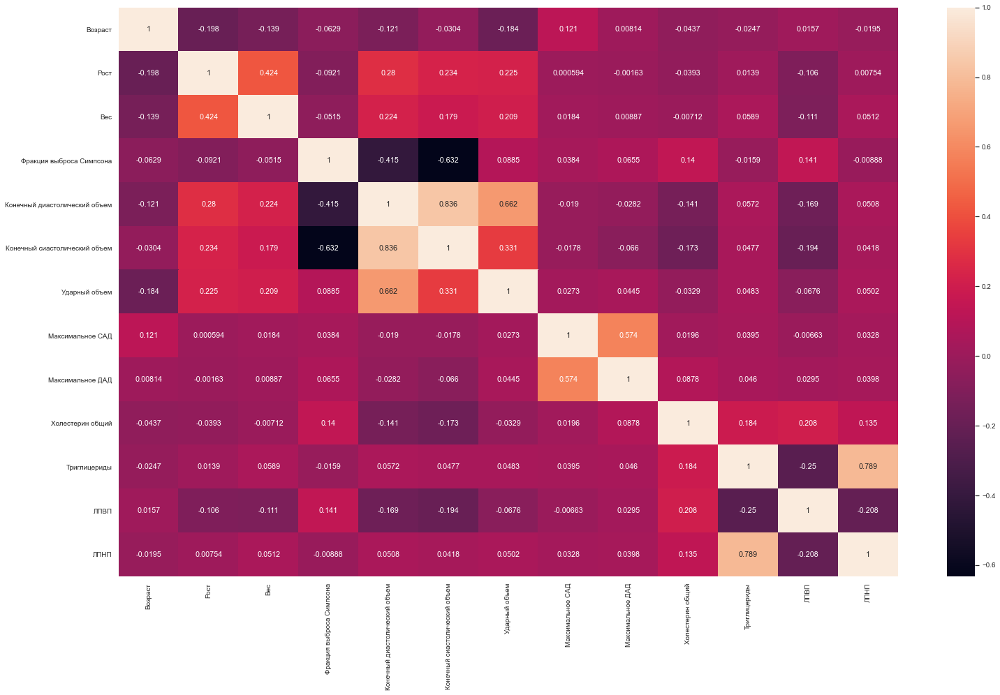

In [ ]:
spearman = df[NUMERICAL].corr(method='spearman')

plt.figure(figsize=(25, 15))
sns.heatmap(spearman, annot=True, fmt='.3g')
plt.show()

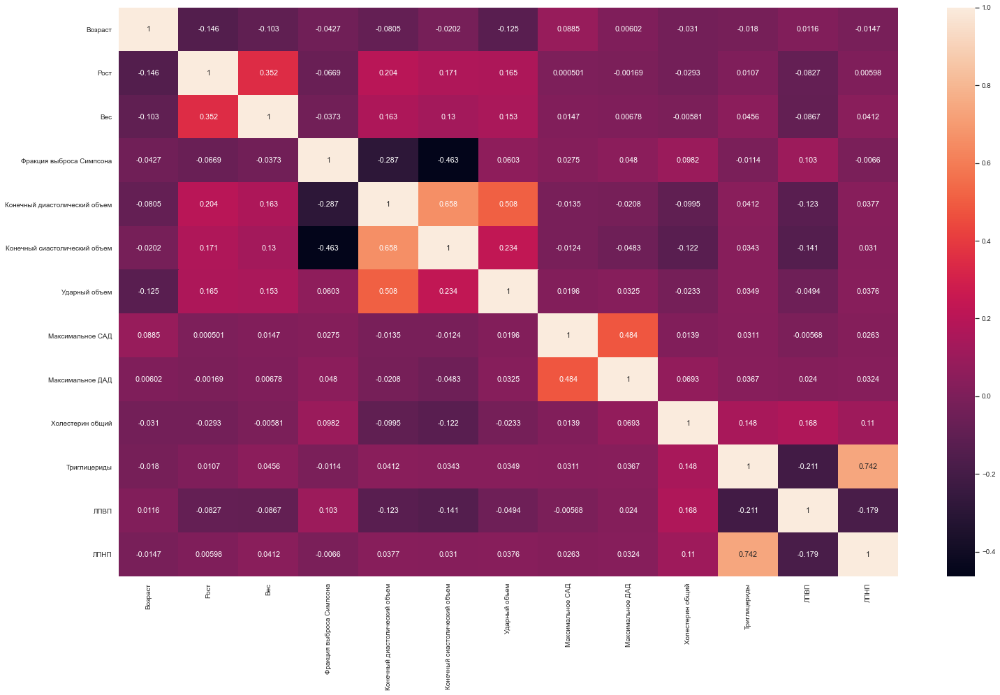

In [ ]:
kendall = df[NUMERICAL].corr(method='kendall')

plt.figure(figsize=(25, 15))
sns.heatmap(kendall, annot=True, fmt='.3g')
plt.show()

The results are pretty similar. Note that in case of a numerical target it is advisable to compute correlations of features with the target to get the most correlated ones.

Other types of graphs which can be useful:
- Regplot
- Catplot
- FacetGrid (factorplot)
- etc.

Relationships between categrical features also can be checked with statistical tests, e.g., a [chi-squared test](https://www.machinelearningmastery.ru/chi-squared-test-for-machine-learning/).

# Feature Engineering (bonus topic)

Better features make better models.

#### Body mass index (BMI)

$ BMI = \frac{m}{h^2},$

where $m$ is mass in kilograms and $h$ is height in metres.

In [ ]:
# your code here

#### Body surface area (BSA)

$BSA = 0.007184\times W^{0.425}\times H^{0.725},$

where $W$ is mass in kilograms and $H$ is height in centimetres.

Other [formulas](https://en.wikipedia.org/wiki/Body_surface_area) of BSA.

In [ ]:
# your code here

#### Mean arterial pressure (MAP)

$MAP = \frac{SBP + 2 DBP}{3},$

where $SBP$ is the systolic pressure in mmHg and $DBP$ is the diastolic pressure in mmHg.

In [ ]:
# your code here

#### Maximum heart rate (MHR)

Tanaka formula for men:

$MHR = 208 - 0.7 \times Age$,

and Gulati formula for women:

$MHR = 206 - 0.88 \times Age$.

In [ ]:
# your code here

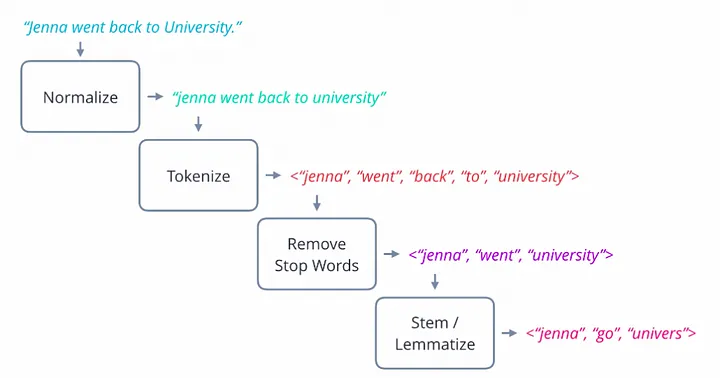

In [ ]:
corpus = ["This is a brown house. This house is big. The street number is 1.",
          "This is a small house. This house has 1 bedroom. The street number is 12.",
          "This dog is brown. This dog likes to play.",
          "The dog is in the bedroom."]

Binary Term Frequency

In [ ]:
tv = TfidfVectorizer(
    binary=True, norm=None,
    use_idf=False, smooth_idf=False,
    lowercase=True, stop_words='english',
    min_df=1, max_df=1.0, max_features=None, ngram_range=(1, 1))
df = pd.DataFrame(tv.fit_transform(corpus).toarray(), columns=tv.get_feature_names_out())
display(df)

,12,bedroom,big,brown,dog,house,likes,number,play,small,street
0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
1,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
2,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
3,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


Bag of Words (BoW) Term Frequency

In [ ]:
tv = TfidfVectorizer(
    binary=False, norm=None,
    use_idf=False, smooth_idf=False,
    lowercase=True, stop_words='english',
    min_df=1, max_df=1.0, max_features=None, ngram_range=(1, 1))
df = pd.DataFrame(tv.fit_transform(corpus).toarray(), columns=tv.get_feature_names_out())
display(df)

,12,bedroom,big,brown,dog,house,likes,number,play,small,street
0,0.0,0.0,1.0,1.0,0.0,2.0,0.0,1.0,0.0,0.0,1.0
1,1.0,1.0,0.0,0.0,0.0,2.0,0.0,1.0,0.0,1.0,1.0
2,0.0,0.0,0.0,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0
3,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


(L1) Normalized Term Frequency




In [ ]:
tv = TfidfVectorizer(
    binary=False, norm='l1',
    use_idf=False, smooth_idf=False,
    lowercase=True, stop_words='english',
    min_df=1, max_df=1.0, max_features=None, ngram_range=(1, 1))
df = pd.DataFrame(tv.fit_transform(corpus).toarray(), columns=tv.get_feature_names_out())
display(df)

,12,bedroom,big,brown,dog,house,likes,number,play,small,street
0,0.000000,0.000000,0.166667,0.166667,0.0,0.333333,0.0,0.166667,0.0,0.000000,0.166667
1,0.142857,0.142857,0.000000,0.000000,0.0,0.285714,0.0,0.142857,0.0,0.142857,0.142857
2,0.000000,0.000000,0.000000,0.200000,0.4,0.000000,0.2,0.000000,0.2,0.000000,0.000000
3,0.000000,0.500000,0.000000,0.000000,0.5,0.000000,0.0,0.000000,0.0,0.000000,0.000000


(L2) Normalized TF-IDF

In [ ]:
tv = TfidfVectorizer(
    binary=False, norm='l2',
    use_idf=True, smooth_idf=True,
    lowercase=True, stop_words='english',
    min_df=1, max_df=1.0, max_features=None, ngram_range=(1, 1))
df = pd.DataFrame(tv.fit_transform(corpus).toarray(), columns=tv.get_feature_names_out())
display(df)

,12,bedroom,big,brown,dog,house,likes,number,play,small,street
0,0.000000,0.000000,0.432291,0.340823,0.000000,0.681647,0.000000,0.340823,0.000000,0.000000,0.340823
1,0.396802,0.312843,0.000000,0.000000,0.000000,0.625687,0.000000,0.312843,0.000000,0.396802,0.312843
2,0.000000,0.000000,0.000000,0.348842,0.697684,0.000000,0.442462,0.000000,0.442462,0.000000,0.000000
3,0.000000,0.707107,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Word2Vec

In [ ]:
import spacy
!python -m spacy download en_core_web_md
nlp = spacy.load("en_core_web_md", disable=['parser', 'ner'])# Get w2v representation of the word 'breakfast'

2023-04-27 17:00:18.141365: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 MB 15.9 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_md')


In [ ]:
print (nlp('patient').vector.size)
print (nlp('patient').vector[:10])# Find cosine similarity between w2v representations of breakfast and universe
print (nlp('patient').similarity(nlp('apple')))
doc1 = nlp("I like oranges that are sweet.")
doc2 = nlp("I like apples that are sour.")
doc1.similarity(doc2)

300
[ 2.6659  3.4691 -1.4417 -0.3202  3.5292 -1.2774 -1.9429  4.6666 -2.9834
  2.9379]
0.13877603933456584


0.9778969482959918